In [1]:
import pickle
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import copy

In [2]:
pickle_path = "../pickles/"
np_data_inputs_list =np.array(pickle.load( open( pickle_path+"strath_full_inputs.p", "rb" ) ))

#load sensor header details
sensor_headers = pd.read_excel("../EMPIR_Data/"+"ScopeDataWithHeadings.xlsx").columns[1:]

#assume loaded sensor data @ np_data_inputs_list
all_appended_sensor_data =[]

if os.path.isfile(pickle_path+"all_appended_sensor_data.p") == False:
    for sensor_number in range(np_data_inputs_list[0].shape[1]):
        sensor_data = []
        for part in range(np_data_inputs_list.shape[0]):
            part_data = np_data_inputs_list[part][:,sensor_number].tolist()
            sensor_data=sensor_data+part_data
        all_appended_sensor_data= all_appended_sensor_data + [np.array(sensor_data)]
    pickle.dump(all_appended_sensor_data, open( pickle_path+"all_appended_sensor_data.p", "wb" ) )
else:
    all_appended_sensor_data = pickle.load( open( pickle_path+"all_appended_sensor_data.p", "rb" ) )


#divide into 80 parts
#**this technique doesn't work 
data_length = all_appended_sensor_data[0].shape[0]/80
data_length = int(np.ceil(data_length))

#signals index
digital_sensor_heating_index = 79
verify_sensor_heating_index = 75
digital_sensor_forging_index = 76
verify_sensor_forging_index = 2

#use digital signal @ sensor 79 to trim off
#for heating stage
digital_sensor_heating = all_appended_sensor_data[digital_sensor_heating_index]
trigger_val = 0.3
rising_edges_heating = np.flatnonzero((digital_sensor_heating[:-1] < trigger_val) & (digital_sensor_heating[1:] > trigger_val))+1
falling_edges_heating_v1 = np.flatnonzero((digital_sensor_heating[:-1] > trigger_val) & (digital_sensor_heating[1:] < trigger_val))+1
rising_edges_heating = rising_edges_heating[:-1]

#use digital signal @ sensor 76 to trim off 
#for forging stage
#from eyeballing, a reasonable trigger value seems to be 500
digital_sensor_forging = all_appended_sensor_data[digital_sensor_forging_index]
trigger_val = 500

rising_edges_forging = np.flatnonzero((digital_sensor_forging[:-1] < trigger_val) & (digital_sensor_forging[1:] > trigger_val))+1

falling_edges_forging =rising_edges_forging[np.arange(1,160,2)]
falling_edges_heating_v2 = rising_edges_forging[np.arange(0,160,2)]

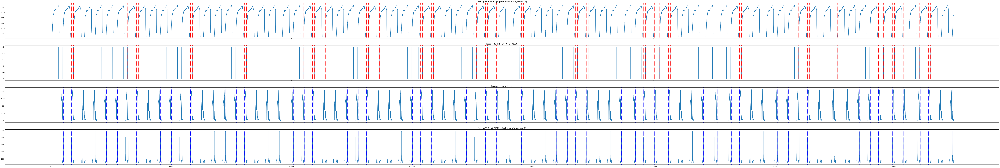

<Figure size 432x288 with 0 Axes>

In [3]:
#start plotting forging and heating processes
fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, dpi = 120, figsize=(120,20),sharex=True)

#heating plots
ax1.plot(all_appended_sensor_data[verify_sensor_heating_index])
ax1.set_title("Heating: "+ sensor_headers[verify_sensor_heating_index])
for xc in rising_edges_heating:
    ax1.axvline(x=xc, color='r', linestyle='--')
for xc in falling_edges_heating_v2:
    ax1.axvline(x=xc, color='r', linestyle='--')
ax2.plot(all_appended_sensor_data[digital_sensor_heating_index])
ax2.set_title("Heating: "+ sensor_headers[digital_sensor_heating_index])
for xc in rising_edges_heating:
    ax2.axvline(x=xc, color='r', linestyle='--')
for xc in falling_edges_heating_v2:
    ax2.axvline(x=xc, color='r', linestyle='--')

#forging plots 
ax3.plot(all_appended_sensor_data[verify_sensor_forging_index])
ax3.set_title("Forging: "+ sensor_headers[verify_sensor_forging_index])
for xc in rising_edges_forging:
    ax3.axvline(x=xc, color='b', linestyle='--')
ax4.plot(all_appended_sensor_data[digital_sensor_forging_index])
ax4.set_title("Forging: "+ sensor_headers[digital_sensor_forging_index])
for xc in rising_edges_forging:
    ax4.axvline(x=xc, color='b', linestyle='--')
    
plot_folder = '../plots/segmentation/seperation_clear'
#plt.savefig(plot_folder+'clear_seperation.png', bbox_inches="tight") 
plt.show()
plt.clf()



In [4]:
#looks good
#now start segmentation for heating
heating_sensor_data = []
for part_number in range(rising_edges_heating.shape[0]):
    current_sensor_data = []
    for sensor_number in range(len(all_appended_sensor_data)):
        data = all_appended_sensor_data[sensor_number][rising_edges_heating[part_number]:falling_edges_heating_v2[part_number]]
        current_sensor_data.append(data)
    heating_sensor_data.append(np.array(current_sensor_data))
    




In [5]:
heating_sensor_data

[array([[10.       , 10.       , 10.       , ..., 20.       , 20.       ,
         20.       ],
        [50.2811097, 50.284064 , 50.2857061, ..., 49.6332681, 49.6263998,
         49.6209166],
        [ 0.       ,  0.       ,  0.       , ..., 30.4476563, 29.0636719,
         29.0636719],
        ...,
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
          0.       ],
        [ 1.       ,  1.       ,  1.       , ...,  1.       ,  1.       ,
          1.       ],
        [ 1.       ,  1.       ,  1.       , ...,  0.       ,  0.       ,
          0.       ]]),
 array([[100.       , 100.       , 100.       , ...,  20.       ,
          20.       ,  20.       ],
        [ 49.2966645,  49.3093864,  49.3231086, ...,  48.8987752,
          48.8899251,  48.8816563],
        [ 30.4476562,  30.4476562,  30.4476562, ...,  29.0636719,
          29.0636719,  30.4476563],
        ...,
        [  0.       ,   0.       ,   0.       , ...,   0.       ,
           0.       ,   

In [7]:
#now start segmentation for forging
forging_sensor_data = []
for part_number in range(int(rising_edges_forging.shape[0]/2)):
    current_sensor_data = []
    for sensor_number in range(len(all_appended_sensor_data)):
        data = all_appended_sensor_data[sensor_number][rising_edges_forging[part_number*2]:rising_edges_forging[part_number*2+1]]
        current_sensor_data.append(data)
    forging_sensor_data.append(np.array(current_sensor_data))
    

In [8]:
forging_sensor_data

[array([[ 20.       ,  20.       ,  20.       , ..., 290.       ,
         290.       , 290.       ],
        [ 49.6144284,  49.6077896,  49.6017043, ...,  49.0396348,
          49.0391017,  49.0385736],
        [ 29.0636719,  29.0636719,  29.0636719, ...,  34.5996094,
          34.5996094,  34.5996094],
        ...,
        [  0.       ,   0.       ,   0.       , ...,   0.       ,
           0.       ,   0.       ],
        [  1.       ,   1.       ,   1.       , ...,   1.       ,
           1.       ,   1.       ],
        [  0.       ,   0.       ,   0.       , ...,   1.       ,
           1.       ,   1.       ]]),
 array([[ 20.       ,  20.       ,  20.       , ..., 290.       ,
         290.       , 290.       ],
        [ 48.8759078,  48.8701351,  48.8626633, ...,  48.7158312,
          48.7193431,  48.7234888],
        [ 30.4476563,  30.4476563,  30.4476563, ...,  29.0636719,
          29.0636719,  30.4476563],
        ...,
        [  0.       ,   0.       ,   0.       , ...,  

DescribeResult(nobs=80, minmax=(14562, 14687), mean=14666.1125, variance=755.2150316455696, skewness=-1.8646433241369953, kurtosis=3.0838042843282905)


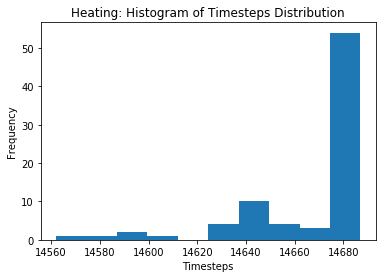

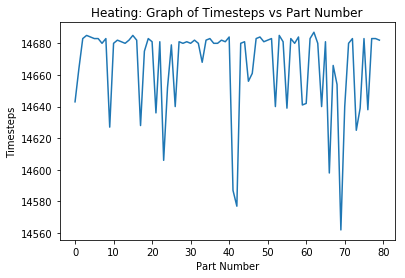

In [6]:
#investigate timesteps of heating input sensors
plot_folder = '../plots/heating_sensors/'
np_data_timesteps = np.array([heating_sensor_data[i].shape[1] for i in range(len(heating_sensor_data))])
print(stats.describe(np_data_timesteps))
plt.title("Heating: Histogram of Timesteps Distribution")
plt.hist(np_data_timesteps)
plt.xlabel("Timesteps")
plt.ylabel("Frequency")
plt.savefig(plot_folder+'heating_histogram_vs_timestep.png', bbox_inches="tight")
plt.show()

plt.title("Heating: Graph of Timesteps vs Part Number")
plt.plot(np.arange(len(np_data_timesteps)),np_data_timesteps)
plt.xlabel("Part Number")
plt.ylabel("Timesteps")
plt.savefig(plot_folder+'heating_timesteps_vs_partnumber.png', bbox_inches="tight")
plt.show()

DescribeResult(nobs=80, minmax=(4312, 4372), mean=4336.9, variance=284.59746835443036, skewness=0.3334635016409562, kurtosis=-1.013391287375179)


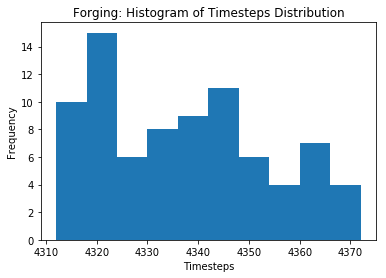

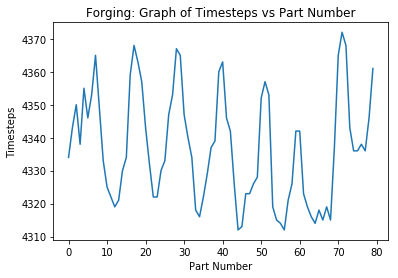

In [9]:
#investigate timesteps of input sensors
plot_folder = '../plots/forging_sensors/'
np_data_timesteps = np.array([forging_sensor_data[i].shape[1] for i in range(len(forging_sensor_data))])
print(stats.describe(np_data_timesteps))
plt.title("Forging: Histogram of Timesteps Distribution")
plt.hist(np_data_timesteps)
plt.xlabel("Timesteps")
plt.ylabel("Frequency")
plt.savefig(plot_folder+'forging_histogram_vs_timestep.png', bbox_inches="tight")
plt.show()

plt.title("Forging: Graph of Timesteps vs Part Number")
plt.plot(np.arange(len(np_data_timesteps)),np_data_timesteps)
plt.xlabel("Part Number")
plt.ylabel("Timesteps")
plt.savefig(plot_folder+'forging_timesteps_vs_partnumber.png', bbox_inches="tight")
plt.show()


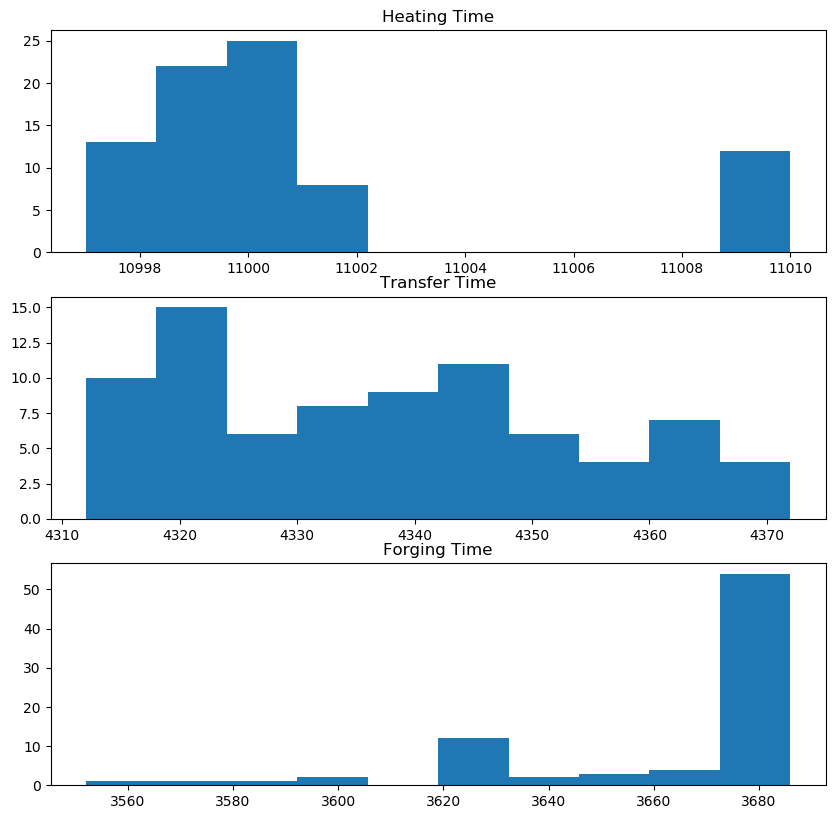

<Figure size 432x288 with 0 Axes>

In [10]:
#==========display time for processes===============
heating_time_v1=falling_edges_heating_v1-rising_edges_heating
heating_time_v2=falling_edges_heating_v2-rising_edges_heating
forging_time = falling_edges_forging - falling_edges_heating_v2
transfer_time = heating_time_v2-heating_time_v1

plt.figure(111,dpi=100,figsize=(10,10))
ax1=plt.subplot(311)
ax1.set_title("Heating Time")
ax1.hist(heating_time_v1)
ax2=plt.subplot(312)
ax2.set_title("Transfer Time")
ax2.hist(forging_time)
ax3=plt.subplot(313)
ax3.hist(transfer_time)
ax3.set_title("Forging Time")
plt.show()
plt.clf()

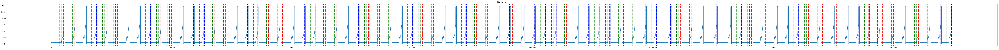

<Figure size 432x288 with 0 Axes>

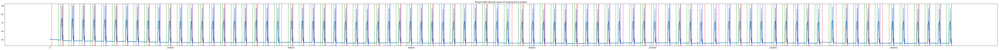

<Figure size 432x288 with 0 Axes>

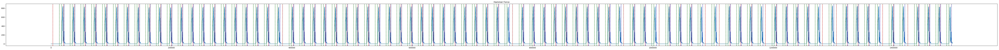

<Figure size 432x288 with 0 Axes>

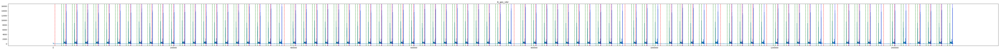

<Figure size 432x288 with 0 Axes>

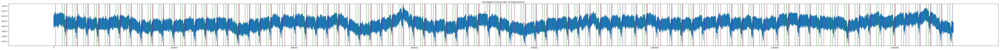

<Figure size 432x288 with 0 Axes>

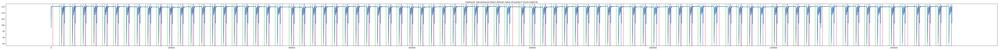

<Figure size 432x288 with 0 Axes>

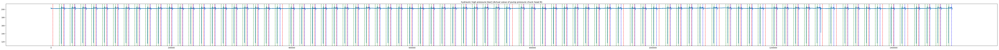

<Figure size 432x288 with 0 Axes>

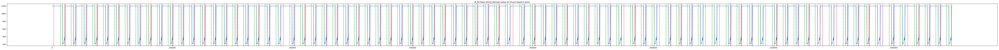

<Figure size 432x288 with 0 Axes>

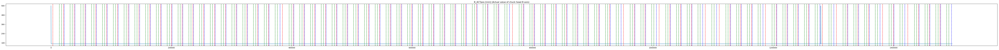

<Figure size 432x288 with 0 Axes>

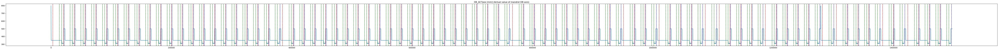

<Figure size 432x288 with 0 Axes>

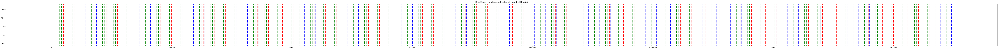

<Figure size 432x288 with 0 Axes>

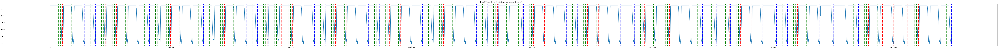

<Figure size 432x288 with 0 Axes>

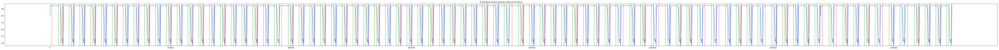

<Figure size 432x288 with 0 Axes>

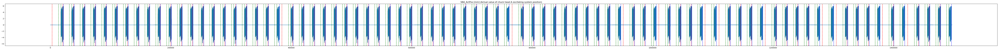

<Figure size 432x288 with 0 Axes>

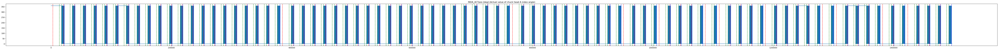

<Figure size 432x288 with 0 Axes>

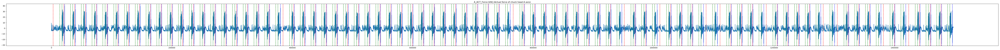

<Figure size 432x288 with 0 Axes>

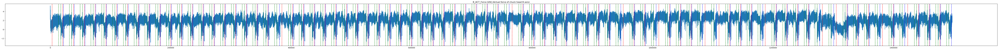

<Figure size 432x288 with 0 Axes>

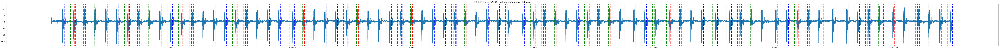

<Figure size 432x288 with 0 Axes>

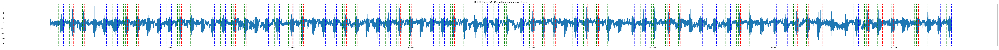

<Figure size 432x288 with 0 Axes>

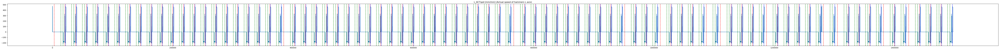

<Figure size 432x288 with 0 Axes>

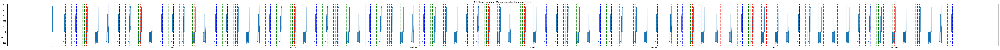

<Figure size 432x288 with 0 Axes>

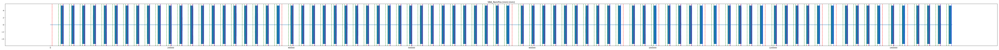

<Figure size 432x288 with 0 Axes>

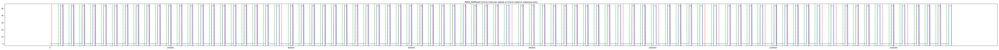

<Figure size 432x288 with 0 Axes>

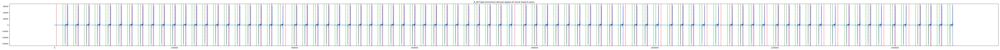

<Figure size 432x288 with 0 Axes>

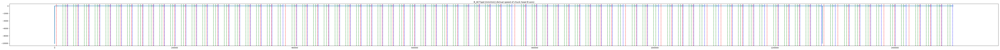

<Figure size 432x288 with 0 Axes>

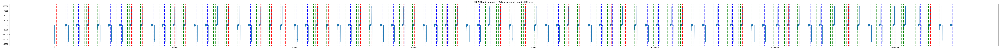

<Figure size 432x288 with 0 Axes>

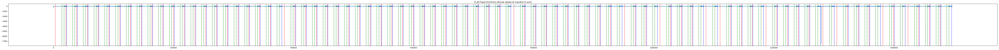

<Figure size 432x288 with 0 Axes>

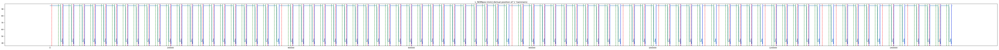

<Figure size 432x288 with 0 Axes>

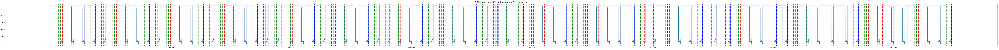

<Figure size 432x288 with 0 Axes>

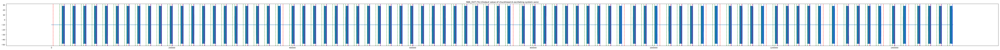

<Figure size 432x288 with 0 Axes>

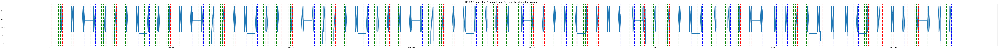

<Figure size 432x288 with 0 Axes>

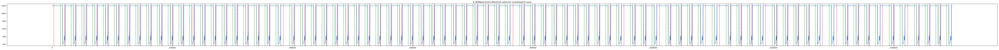

<Figure size 432x288 with 0 Axes>

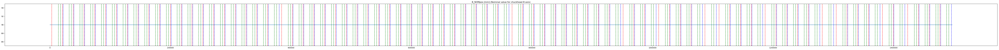

<Figure size 432x288 with 0 Axes>

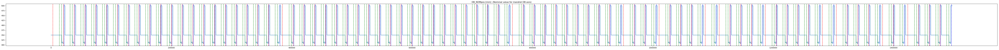

<Figure size 432x288 with 0 Axes>

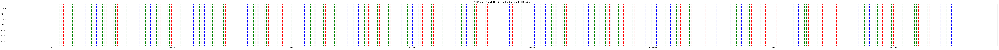

<Figure size 432x288 with 0 Axes>

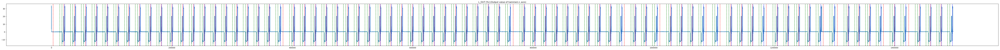

<Figure size 432x288 with 0 Axes>

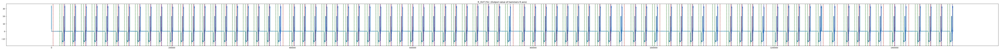

<Figure size 432x288 with 0 Axes>

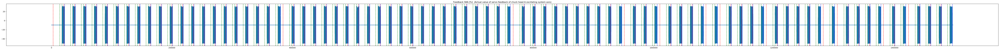

<Figure size 432x288 with 0 Axes>

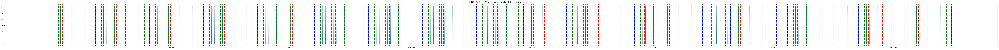

<Figure size 432x288 with 0 Axes>

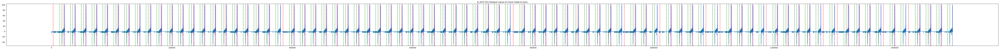

<Figure size 432x288 with 0 Axes>

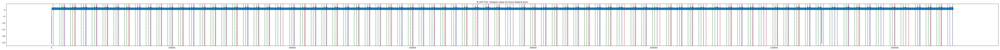

<Figure size 432x288 with 0 Axes>

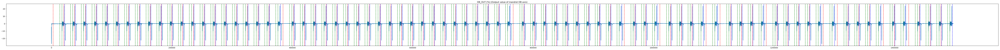

<Figure size 432x288 with 0 Axes>

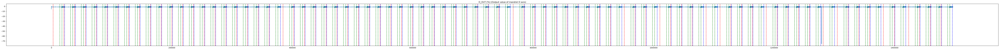

<Figure size 432x288 with 0 Axes>

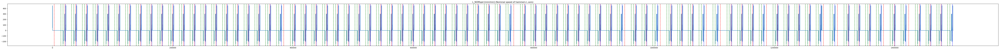

<Figure size 432x288 with 0 Axes>

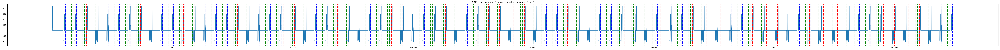

<Figure size 432x288 with 0 Axes>

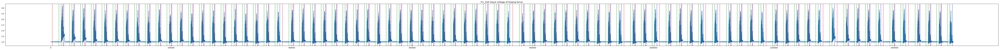

<Figure size 432x288 with 0 Axes>

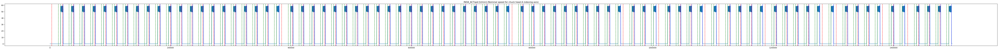

<Figure size 432x288 with 0 Axes>

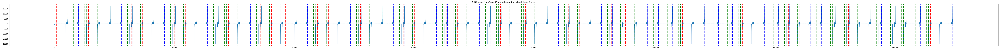

<Figure size 432x288 with 0 Axes>

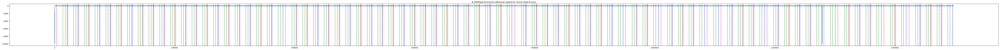

<Figure size 432x288 with 0 Axes>

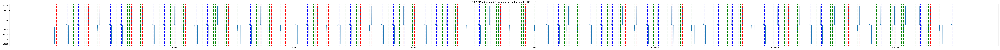

<Figure size 432x288 with 0 Axes>

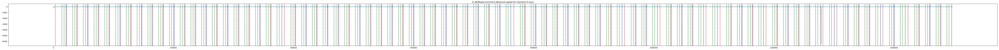

<Figure size 432x288 with 0 Axes>

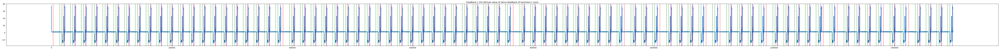

<Figure size 432x288 with 0 Axes>

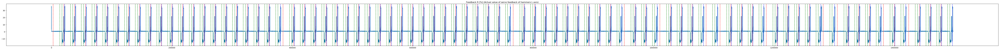

<Figure size 432x288 with 0 Axes>

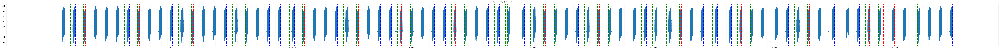

<Figure size 432x288 with 0 Axes>

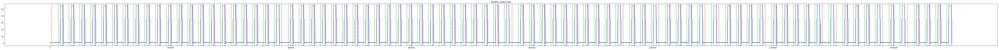

<Figure size 432x288 with 0 Axes>

KeyboardInterrupt: 

In [11]:
#start plotting forging and heating processes
for verify_sensor_heating_index in range(98):
    if(verify_sensor_heating_index != 5):
        plt.figure(111,dpi=100,figsize=(100,15))
        plot_folder = '../plots/segmentation_triple_phase/'
        #determine clear seperation
        #heating plots
    
        ax1=plt.subplot(311)
        ax1.plot(all_appended_sensor_data[verify_sensor_heating_index])
        ax1.set_title(sensor_headers[verify_sensor_heating_index])
        for xc in rising_edges_heating:
            ax1.axvline(x=xc, color='r', linestyle='--')
        for xc in falling_edges_heating_v1:
            ax1.axvline(x=xc, color='g', linestyle='--')
        for xc in falling_edges_heating_v2:
            ax1.axvline(x=xc, color='g', linestyle='--')
        for xc in falling_edges_forging:
            ax1.axvline(x=xc, color='b', linestyle='--')
        plt.savefig(plot_folder+'sensor_'+str(verify_sensor_heating_index)+'.png', bbox_inches="tight")
        plt.show()
        plt.clf()
